# EDA - Movielens 100k dataset

Download dataset from https://movielens.org/
Open the 3 datasets u.data, u.item, u.user
Display univariate plots on age, release date, gender and occupation
Visualize how popularity of genres changed over the years
Display top 25 movies based on ratings
Compare the movie trends among male and female audiences 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
#display entire columns and rows in the dataframe
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [3]:
ratings = pd.read_csv('D:/Python/Ratings.csv')

In [4]:
ratings.head()

,user id,item id,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [5]:
#stamdardize feature names
ratings.columns = ['user_id', 'movie_id', 'rating', 'time_stamp']

In [6]:
ratings.head()

,user_id,movie_id,rating,time_stamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [7]:
movies = pd.read_csv('D:/Python/Movie details.csv', encoding = 'latin-1')

In [8]:
movies.head()

,movie id,movie title,release date,video release date,IMDb URL,unknown,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,Toy Story (1995),1-Jan-95,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,GoldenEye (1995),1-Jan-95,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,3,Four Rooms (1995),1-Jan-95,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,4,Get Shorty (1995),1-Jan-95,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,5,Copycat (1995),1-Jan-95,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0


In [9]:
#standardize feature names
movies.columns = ['movie_id','movie_title','release_date','video_release_date','IMDb_url','unknown','action','adventure','animation','childrens','comedy','crime','documentary','drama','fantasy','film_noir','horror','musical','mystery','romance','scifi','thiller','war','western']

In [10]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   movie_id            1682 non-null   int64  
 1   movie_title         1682 non-null   object 
 2   release_date        1681 non-null   object 
 3   video_release_date  0 non-null      float64
 4   IMDb_url            1679 non-null   object 
 5   unknown             1682 non-null   int64  
 6   action              1682 non-null   int64  
 7   adventure           1682 non-null   int64  
 8   animation           1682 non-null   int64  
 9   childrens           1682 non-null   int64  
 10  comedy              1682 non-null   int64  
 11  crime               1682 non-null   int64  
 12  documentary         1682 non-null   int64  
 13  drama               1682 non-null   int64  
 14  fantasy             1682 non-null   int64  
 15  film_noir           1682 non-null   int64  
 16  horror

In [11]:
users = pd.read_csv('D:/Python/user level info.csv', encoding = 'latin-1')

In [12]:
users.head()

,user id,age,gender,occupation,zip code
0,1,24,M,technician,85711
1,2,53,F,other,94043
2,3,23,M,writer,32067
3,4,24,M,technician,43537
4,5,33,F,other,15213


In [13]:
users.columns = ['user_id','age','gender','occupation','zip_code']

In [14]:
#merge 2 df having one common feature
movie_rating = pd.merge(ratings, movies, on = 'movie_id')

In [15]:
movie_rating.head(50)

,user_id,movie_id,rating,time_stamp,movie_title,release_date,video_release_date,IMDb_url,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western
0,196,242,3,881250949,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,63,242,3,875747190,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,226,242,5,883888671,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,154,242,3,879138235,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,306,242,5,876503793,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
5,296,242,4,884196057,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,34,242,5,888601628,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,271,242,4,885844495,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,201,242,4,884110598,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
9,209,242,4,883589606,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [16]:
#merge 2 df having one common feature
final_data = pd.merge(movie_rating, users, on = 'user_id')

In [17]:
final_data.head()

,user_id,movie_id,rating,time_stamp,movie_title,release_date,video_release_date,IMDb_url,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age,gender,occupation,zip_code
0,196,242,3,881250949,Kolya (1996),24-Jan-97,NaN,http://us.imdb.com/M/title-exact?Kolya%20(1996),0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer,55105
1,196,257,2,881251577,Men in Black (1997),4-Jul-97,NaN,http://us.imdb.com/M/title-exact?Men+in+Black+...,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,49,M,writer,55105
2,196,111,4,881251793,"Truth About Cats & Dogs, The (1996)",26-Apr-96,NaN,http://us.imdb.com/M/title-exact?Truth%20About...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,49,M,writer,55105
3,196,25,4,881251955,"Birdcage, The (1996)",8-Mar-96,NaN,"http://us.imdb.com/M/title-exact?Birdcage,%20T...",0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer,55105
4,196,382,4,881251843,"Adventures of Priscilla, Queen of the Desert, ...",1-Jan-94,NaN,http://us.imdb.com/M/title-exact?Adventures%20...,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,49,M,writer,55105


In [18]:
#dropping irrelevant features
final_data.drop(['user_id','movie_id', 'time_stamp','video_release_date','IMDb_url', 'zip_code'], axis=1, inplace = True)

In [19]:
#extract the release year from the release date
final_data['release_year'] = final_data['release_date'].str.split('-', expand = True)[2]
#final_data['release_year'] = pd.to_numeric(final_data['release_year'], errors = 'coerce')
#final_data['release_year'] = final_data.release_year.astype(int)
final_data.head()

,rating,movie_title,release_date,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age,gender,occupation,release_year
0,3,Kolya (1996),24-Jan-97,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer,97
1,2,Men in Black (1997),4-Jul-97,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,49,M,writer,97
2,4,"Truth About Cats & Dogs, The (1996)",26-Apr-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,49,M,writer,96
3,4,"Birdcage, The (1996)",8-Mar-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer,96
4,4,"Adventures of Priscilla, Queen of the Desert, ...",1-Jan-94,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,49,M,writer,94


In [41]:
#re arrange columns for better clarity
cols = final_data.columns.tolist()
cols = cols[-1:]+cols[:-1]
cols

['release_year',
 'rating',
 'movie_title',
 'release_date',
 'unknown',
 'action',
 'adventure',
 'animation',
 'childrens',
 'comedy',
 'crime',
 'documentary',
 'drama',
 'fantasy',
 'film_noir',
 'horror',
 'musical',
 'mystery',
 'romance',
 'scifi',
 'thiller',
 'war',
 'western',
 'age',
 'gender',
 'occupation']

In [42]:
final_data = final_data[cols]

In [43]:
final_data.head()

,release_year,rating,movie_title,release_date,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age,gender,occupation
0,97,3,Kolya (1996),24-Jan-97,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer
1,97,2,Men in Black (1997),4-Jul-97,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,49,M,writer
2,96,4,"Truth About Cats & Dogs, The (1996)",26-Apr-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,49,M,writer
3,96,4,"Birdcage, The (1996)",8-Mar-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer
4,94,4,"Adventures of Priscilla, Queen of the Desert, ...",1-Jan-94,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,49,M,writer


In [63]:
final_data.isnull().sum()

release_year    9
rating          0
movie_title     0
release_date    9
unknown         0
action          0
adventure       0
animation       0
childrens       0
comedy          0
crime           0
documentary     0
drama           0
fantasy         0
film_noir       0
horror          0
musical         0
mystery         0
romance         0
scifi           0
thiller         0
war             0
western         0
age             0
gender          0
occupation      0
dtype: int64

In [64]:
final_data.dropna(inplace = True)

In [66]:
final_data.isnull().sum()

release_year    0
rating          0
movie_title     0
release_date    0
unknown         0
action          0
adventure       0
animation       0
childrens       0
comedy          0
crime           0
documentary     0
drama           0
fantasy         0
film_noir       0
horror          0
musical         0
mystery         0
romance         0
scifi           0
thiller         0
war             0
western         0
age             0
gender          0
occupation      0
dtype: int64

In [21]:
final_data['movie_title']

0                                             Kolya (1996)
1                                      Men in Black (1997)
2                      Truth About Cats & Dogs, The (1996)
3                                     Birdcage, The (1996)
4        Adventures of Priscilla, Queen of the Desert, ...
5                                     Groundhog Day (1993)
6                              Fish Called Wanda, A (1988)
7                              English Patient, The (1996)
8                           While You Were Sleeping (1995)
9                                That Thing You Do! (1996)
10                              Princess Bride, The (1987)
11                                  Raising Arizona (1987)
12                                       Home Alone (1990)
13                                  Beautiful Girls (1996)
14                                 Muriel's Wedding (1994)
15             Mrs. Brown (Her Majesty, Mrs. Brown) (1997)
16                                             Babe (199

In [22]:
final_data.iloc[67009]

rating                                                          4
movie_title     Nosferatu (Nosferatu, eine Symphonie des Graue...
release_date                                             1-Jan-22
unknown                                                         0
action                                                          0
adventure                                                       0
animation                                                       0
childrens                                                       0
comedy                                                          0
crime                                                           0
documentary                                                     0
drama                                                           0
fantasy                                                         0
film_noir                                                       0
horror                                                          1
musical   

In [57]:
#checking top 25 movies based on number of ratings 
top25 = final_data.groupby('movie_title').sum()
top25

,rating,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age
movie_title,,,,,,,,,,,,,,,,,,,,,
'Til There Was You (1997),21,0,0,0,0,0,0,0,0,9,0,0,0,0,0,9,0,0,0,0,222
1-900 (1994),13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,155
101 Dalmatians (1996),317,0,0,0,0,109,109,0,0,0,0,0,0,0,0,0,0,0,0,0,3535
12 Angry Men (1957),543,0,0,0,0,0,0,0,0,125,0,0,0,0,0,0,0,0,0,0,4398
187 (1997),124,0,0,0,0,0,0,0,0,41,0,0,0,0,0,0,0,0,0,0,1195
2 Days in the Valley (1996),300,0,0,0,0,0,0,93,0,0,0,0,0,0,0,0,0,0,0,0,2868
"20,000 Leagues Under the Sea (1954)",252,0,0,72,0,72,0,0,0,0,72,0,0,0,0,0,72,0,0,0,2587
2001: A Space Odyssey (1968),1028,0,0,0,0,0,0,0,0,259,0,0,0,0,259,0,259,259,0,0,8933
3 Ninjas: High Noon At Mega Mountain (1998),5,0,5,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,163


In [58]:
top25 = final_data.groupby('movie_title').sum().sort_values(by = 'rating', ascending = False)[:25]
top25

,rating,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age
movie_title,,,,,,,,,,,,,,,,,,,,,
Star Wars (1977),2541,0,583,583,0,0,0,0,0,0,0,0,0,0,0,583,583,0,583,0,19087
Fargo (1996),2111,0,0,0,0,0,0,508,0,508,0,0,0,0,0,0,0,508,0,0,17465
Return of the Jedi (1983),2032,0,507,507,0,0,0,0,0,0,0,0,0,0,0,507,507,0,507,0,16300
Contact (1997),1936,0,0,0,0,0,0,0,0,509,0,0,0,0,0,0,509,0,0,0,16668
Raiders of the Lost Ark (1981),1786,0,420,420,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13866
"Godfather, The (1972)",1769,0,413,0,0,0,0,413,0,413,0,0,0,0,0,0,0,0,0,0,14546
"English Patient, The (1996)",1759,0,0,0,0,0,0,0,0,481,0,0,0,0,0,481,0,0,481,0,17831
Toy Story (1995),1753,0,0,0,452,452,452,0,0,0,0,0,0,0,0,0,0,0,0,0,14444
"Silence of the Lambs, The (1991)",1673,0,0,0,0,0,0,0,0,390,0,0,0,0,0,0,0,390,0,0,12879


In [59]:
#display top movies as list
topmovies = top25.index.tolist()
topmovies

['Star Wars (1977)',
 'Fargo (1996)',
 'Return of the Jedi (1983)',
 'Contact (1997)',
 'Raiders of the Lost Ark (1981)',
 'Godfather, The (1972)',
 'English Patient, The (1996)',
 'Toy Story (1995)',
 'Silence of the Lambs, The (1991)',
 'Scream (1996)',
 'Pulp Fiction (1994)',
 'Air Force One (1997)',
 'Empire Strikes Back, The (1980)',
 'Liar Liar (1997)',
 'Twelve Monkeys (1995)',
 'Titanic (1997)',
 'Independence Day (ID4) (1996)',
 'Chasing Amy (1997)',
 'Jerry Maguire (1996)',
 'Rock, The (1996)',
 'Fugitive, The (1993)',
 'Princess Bride, The (1987)',
 'Back to the Future (1985)',
 'Star Trek: First Contact (1996)',
 "Schindler's List (1993)"]

In [37]:
#display top movies as series
series = pd.Series(topmovies)
series

0                     Star Wars (1977)
1                         Fargo (1996)
2            Return of the Jedi (1983)
3                       Contact (1997)
4       Raiders of the Lost Ark (1981)
5                Godfather, The (1972)
6          English Patient, The (1996)
7                     Toy Story (1995)
8     Silence of the Lambs, The (1991)
9                        Scream (1996)
10                 Pulp Fiction (1994)
11                Air Force One (1997)
12     Empire Strikes Back, The (1980)
13                    Liar Liar (1997)
14               Twelve Monkeys (1995)
15                      Titanic (1997)
16       Independence Day (ID4) (1996)
17                  Chasing Amy (1997)
18                Jerry Maguire (1996)
19                    Rock, The (1996)
20                Fugitive, The (1993)
21          Princess Bride, The (1987)
22           Back to the Future (1985)
23     Star Trek: First Contact (1996)
24             Schindler's List (1993)
dtype: object

In [39]:
#display top movies as dataframe
dataframe = pd.DataFrame(series)
dataframe

,0
0,Star Wars (1977)
1,Fargo (1996)
2,Return of the Jedi (1983)
3,Contact (1997)
4,Raiders of the Lost Ark (1981)
5,"Godfather, The (1972)"
6,"English Patient, The (1996)"
7,Toy Story (1995)
8,"Silence of the Lambs, The (1991)"
9,Scream (1996)


Text(0, 0.5, 'movies')

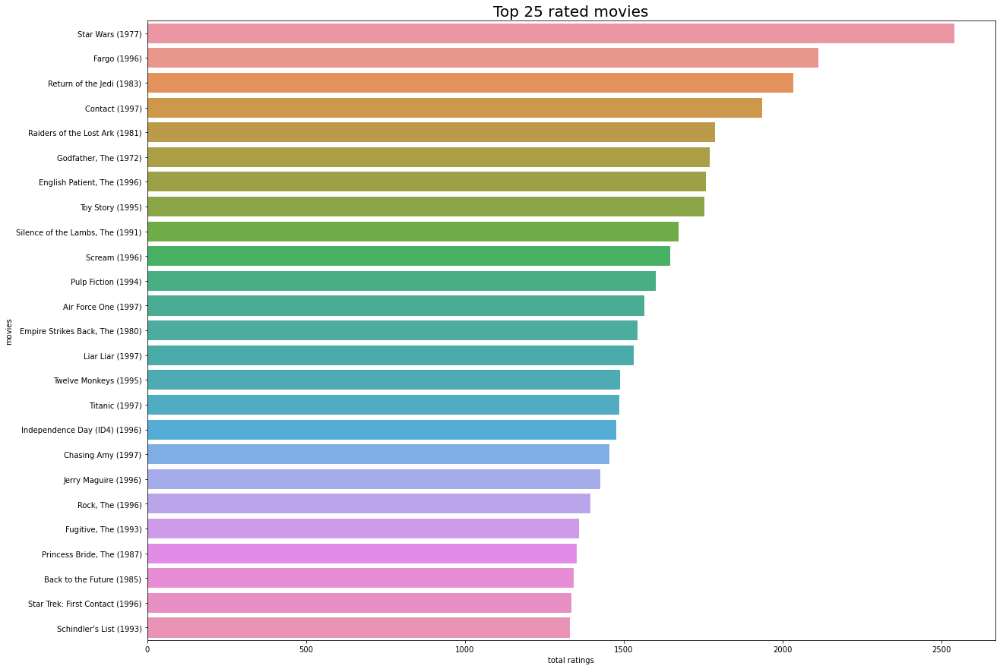

In [61]:
#plot top25 movies based on ratings
plt.figure(figsize =(20,15))
sns.barplot(top10['rating'], top25.index)
plt.title("Top 25 rated movies", fontsize = 20)
plt.xlabel("total ratings", fontsize = 10)
plt.ylabel("movies", fontsize = 10)

In [62]:
#find least 10 rated movies
least10 = final_data.groupby('movie_title').sum().sort_values(by = 'rating', ascending = False)[-10:]
least10                                                                                    

,rating,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age
movie_title,,,,,,,,,,,,,,,,,,,,,
Lashou shentan (1992),1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,22
"I, Worst of All (Yo, la peor de todas) (1990)",1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,22
King of New York (1990),1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,18
Butterfly Kiss (1995),1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,25
"Symphonie pastorale, La (1946)",1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,22
T-Men (1947),1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,22
JLG/JLG - autoportrait de décembre (1994),1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,26
Careful (1992),1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,22
"Invitation, The (Zaproszenie) (1986)",1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,22


In [26]:
#find the popularity of genres by year
genre_by_year = final_data.groupby('release_year').sum().sort_values(by = 'rating', ascending = False)
genre_by_year

,rating,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age
release_year,,,,,,,,,,,,,,,,,,,,,
96,65520,0,4573,2793,748,1038,5798,1035,232,8513,458,82,962,852,613,3477,1678,4496,1832,87,633156
97,58704,0,5674,1963,164,775,4480,2340,99,6700,96,370,573,206,2198,3359,2716,6024,1763,0,575480
95,35347,0,2328,1018,550,1118,3641,1143,23,4677,157,57,294,113,140,2455,1108,2456,282,60,329725
94,30456,0,1741,878,244,605,3524,784,222,3787,211,0,375,237,109,2367,358,1521,499,319,283853
93,23465,0,1675,724,118,347,2515,384,38,2662,0,4,192,162,179,1498,616,1144,387,117,212078
89,8770,0,948,746,0,0,521,201,0,1263,0,0,0,0,0,290,214,182,295,0,77202
92,8014,0,684,142,285,219,671,445,0,546,0,0,314,219,101,652,315,466,247,182,72500
90,7482,0,579,256,0,137,624,316,29,970,0,89,4,0,0,453,0,690,0,300,67306
91,7150,0,456,161,202,202,172,0,17,904,24,0,13,248,0,0,544,856,34,0,61170


In [27]:
#drop the irrelevant columns
genre_by_year.drop(['rating', 'age'], axis = 1, inplace = True)

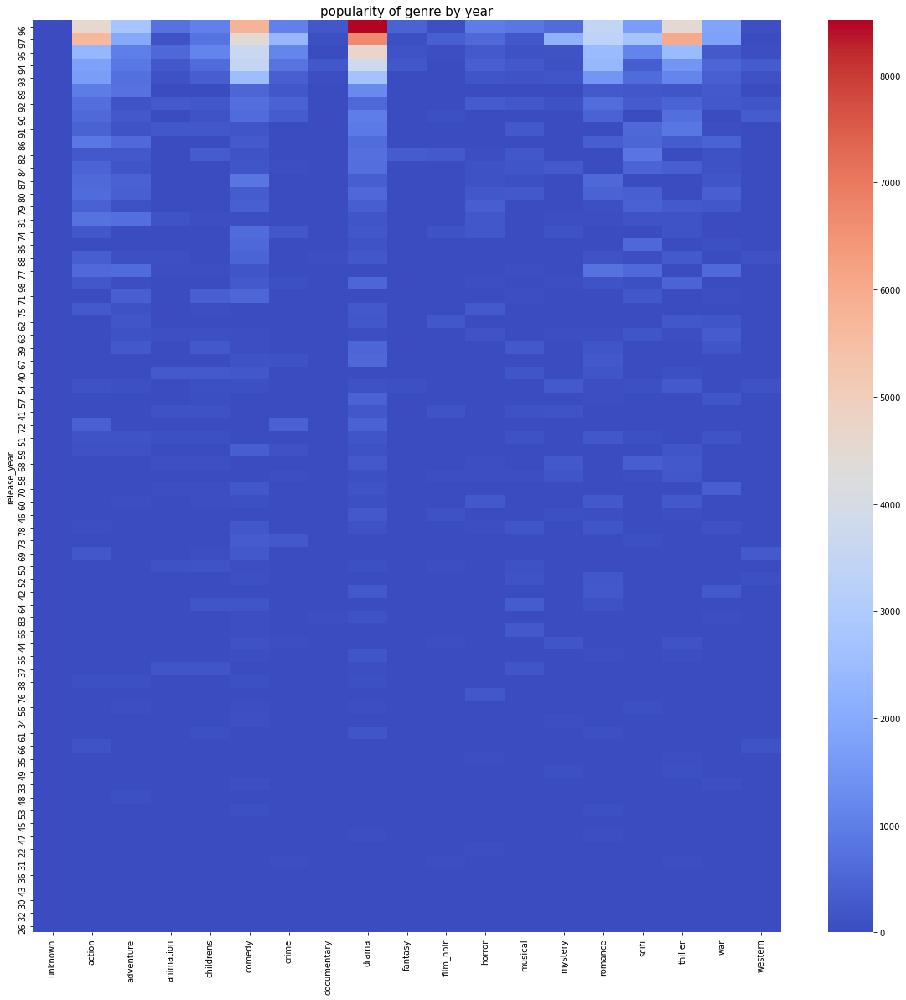

In [32]:
#visualize the popularity of genre through years
plt.figure(figsize=(20,20))  #setting the figure size
sns.heatmap(genre_by_year, cmap = 'coolwarm')  #heat map to plot the above table
plt.title("popularity of genre by year", fontsize = 15)
plt.show()

In [40]:
final_data.head()

,rating,movie_title,release_date,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age,gender,occupation,release_year
0,3,Kolya (1996),24-Jan-97,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer,97
1,2,Men in Black (1997),4-Jul-97,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,49,M,writer,97
2,4,"Truth About Cats & Dogs, The (1996)",26-Apr-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,49,M,writer,96
3,4,"Birdcage, The (1996)",8-Mar-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer,96
4,4,"Adventures of Priscilla, Queen of the Desert, ...",1-Jan-94,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,49,M,writer,94


In [36]:
final_data.sort_values(by = 'release_year', ascending = True, inplace = True)

In [37]:
final_data.shape

(100000, 26)

In [38]:
final_data.head()

,rating,movie_title,release_date,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age,gender,occupation,release_year
12365,5,"Nosferatu (Nosferatu, eine Symphonie des Graue...",1-Jan-22,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,47,M,educator,22
32432,3,"Nosferatu (Nosferatu, eine Symphonie des Graue...",1-Jan-22,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,44,F,writer,22
98166,3,"Nosferatu (Nosferatu, eine Symphonie des Graue...",1-Jan-22,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,30,M,other,22
25584,3,"Nosferatu (Nosferatu, eine Symphonie des Graue...",1-Jan-22,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,23,M,engineer,22
24175,4,"Nosferatu (Nosferatu, eine Symphonie des Graue...",1-Jan-22,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,24,M,entertainment,22


<AxesSubplot:xlabel='age'>

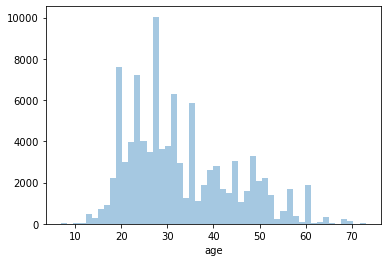

In [39]:
#distribution of age
sns.distplot(final_data['age'], kde = False)

<AxesSubplot:xlabel='age', ylabel='Density'>

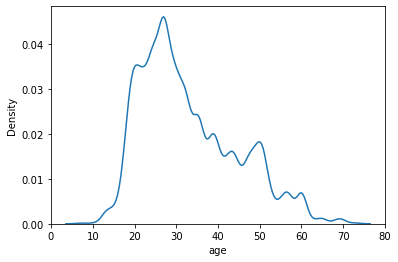

In [40]:
#distribution of age kde plot
sns.kdeplot(final_data['age'])

<AxesSubplot:xlabel='age', ylabel='Density'>

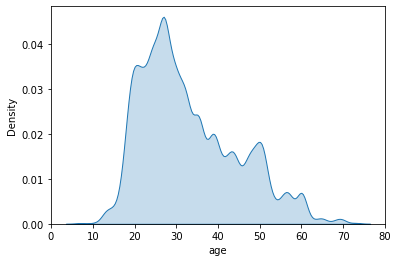

In [41]:
#distribution of age kde plot filled
sns.kdeplot(final_data['age'], shade = True)

<AxesSubplot:xlabel='gender', ylabel='count'>

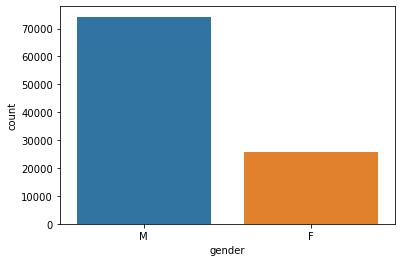

In [42]:
#gender
sns.countplot(final_data['gender'])

<AxesSubplot:xlabel='age', ylabel='rating'>

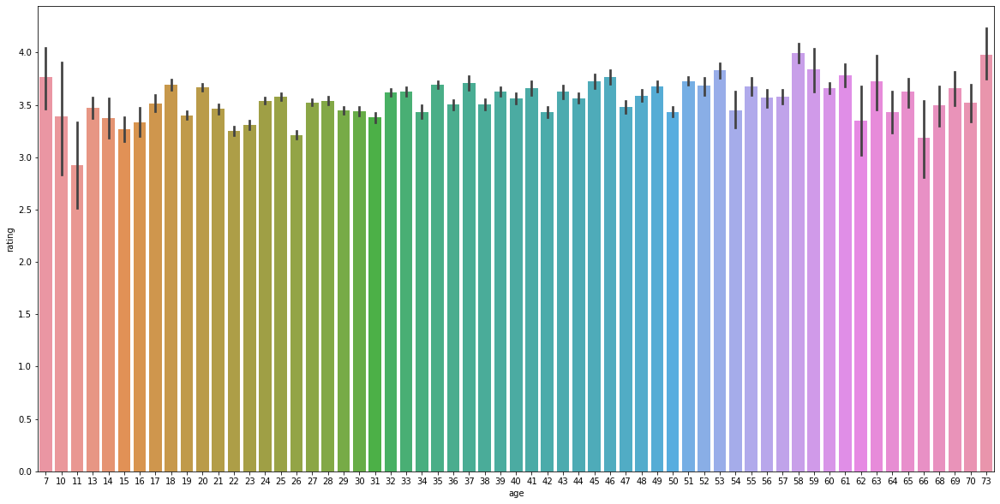

In [43]:
#age vs rating
import matplotlib.pyplot as plt
plt.figure(figsize = (20,10))
sns.barplot(final_data['age'], final_data['rating'])

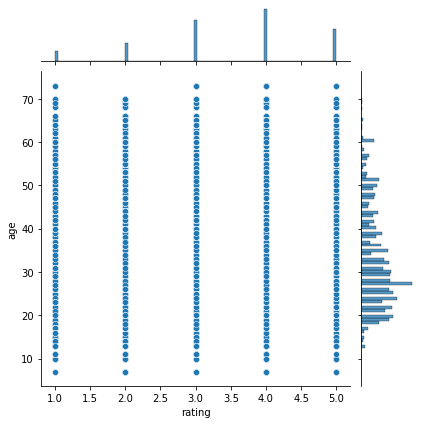

In [45]:
#age vs rating 
sns.jointplot(final_data['rating'], final_data['age'])

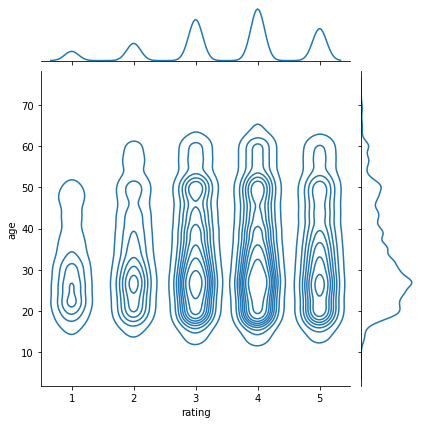

In [25]:
#age vs rating kde plot
sns.jointplot(final_data['rating'], final_data['age'], kind = 'kde')

<AxesSubplot:xlabel='age'>

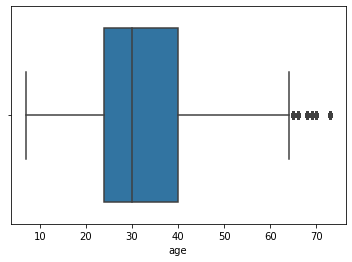

In [46]:
#box plot age
sns.boxplot(final_data['age'])

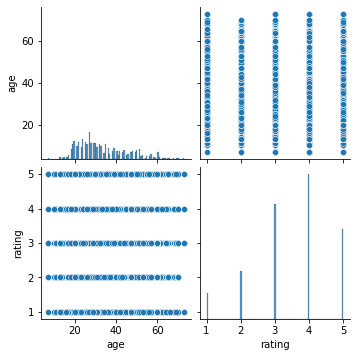

In [47]:
#pairplot age vs rating
sns.pairplot(final_data[['age', 'rating']])

In [47]:
final_data.head()

,release_year,rating,movie_title,release_date,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age,gender,occupation
0,97,3,Kolya (1996),24-Jan-97,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer
1,97,2,Men in Black (1997),4-Jul-97,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,49,M,writer
2,96,4,"Truth About Cats & Dogs, The (1996)",26-Apr-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,49,M,writer
3,96,4,"Birdcage, The (1996)",8-Mar-96,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,49,M,writer
4,94,4,"Adventures of Priscilla, Queen of the Desert, ...",1-Jan-94,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,49,M,writer


In [50]:
#gender and rating
gender = final_data.groupby('gender').sum()

In [51]:
gender

,rating,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western,age
gender,,,,,,,,,,,,,,,,,,,,,
F,90901,2,5442,3141,995,2232,8068,1794,187,11008,363,385,1197,1442,1314,5858,2629,5086,2189,371,831781
M,262085,8,20147,10612,2610,4950,21764,6261,571,28887,989,1348,4120,3512,3931,13603,10101,16786,7209,1483,2465204


In [53]:
gender.drop(['rating', 'age'], axis = 1, inplace = True)

In [54]:
gender

,unknown,action,adventure,animation,childrens,comedy,crime,documentary,drama,fantasy,film_noir,horror,musical,mystery,romance,scifi,thiller,war,western
gender,,,,,,,,,,,,,,,,,,,
F,2,5442,3141,995,2232,8068,1794,187,11008,363,385,1197,1442,1314,5858,2629,5086,2189,371
M,8,20147,10612,2610,4950,21764,6261,571,28887,989,1348,4120,3512,3931,13603,10101,16786,7209,1483


<AxesSubplot:ylabel='gender'>

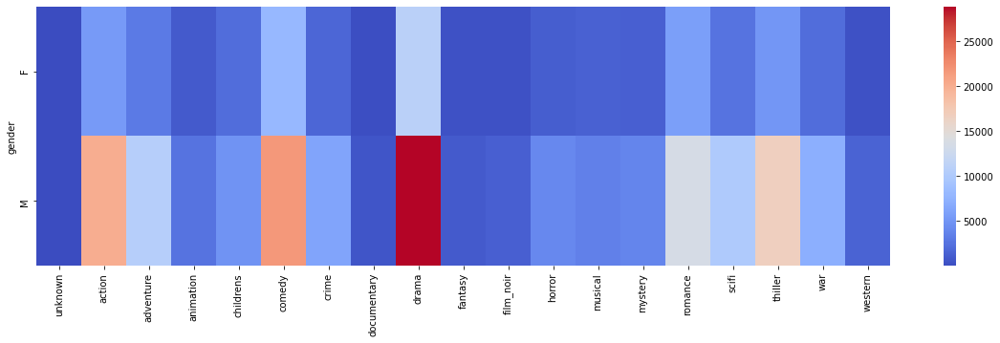

In [56]:
#visualize gender and rating 
plt.figure(figsize = (20,5))
sns.heatmap(gender, cmap = 'coolwarm')

# End of notebook